In [ ]:

import pathlib
import pandas as pd
import pathlib
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import os
from torch.utils.data import DataLoader
from torch.nn.utils.rnn import pad_sequence
import torch
from torch.utils.data import Dataset
from torch.nn.utils.rnn import pad_sequence

import cebra
from cebra import CEBRA

import tempfile
from pathlib import Path

import pickle
from pathlib import Path

from sklearn.manifold import TSNE

import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import (
    Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization,
    LSTM, Bidirectional, GlobalAveragePooling1D
)
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf
import polars as pl
from sklearn.metrics import confusion_matrix

import numpy as np
from sktime.transformations.panel.rocket import MiniRocketMultivariate
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeClassifierCV
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report, f1_score

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

import gc

import pickle


In [ ]:


TARGET_GESTURES = [
    'Above ear - pull hair',
    'Cheek - pinch skin',
    'Eyebrow - pull hair',
    'Eyelash - pull hair',
    'Forehead - pull hairline',
    'Forehead - scratch',
    'Neck - pinch skin',
    'Neck - scratch',
]

NON_TARGET_GESTURES = [
    'Write name on leg',
    'Wave hello',
    'Glasses on/off',
    'Text on phone',
    'Write name in air',
    'Feel around in tray and pull out an object',
    'Scratch knee/leg skin',
    'Pull air toward your face',
    'Drink from bottle/cup',
    'Pinch knee/leg skin',
]

ALL_GESTURES_SET = TARGET_GESTURES + NON_TARGET_GESTURES



gesture2idx = {g: i for i, g in enumerate(ALL_GESTURES_SET)}
idx2gesture = {i: g for g, i in gesture2idx.items()}
num_classes = len(ALL_GESTURES_SET)
print("Num gesture classes:", num_classes)



In [ ]:

#print("Loaded scenarios:", len(splits_store))
#print(list(splits_store.keys())[:5])  # show a few keys

In [ ]:
df_cebra_res=pd.read_csv('res/cebra_feats.csv')

In [ ]:
df_cebra_res

In [ ]:
drop_thermal_and_tof_options=[True,False]
use_raw_imus_options=[False,True]
use_physics_features_options=[False,True]
cebra_output_dims_list=[2,8,20,32]


for cebra_output_dims in cebra_output_dims_list:
    for drop_thermal_and_tof in drop_thermal_and_tof_options:
        for use_raw_imus in use_raw_imus_options:
            for use_physics_features in use_physics_features_options:
                if drop_thermal_and_tof and not use_physics_features and not use_raw_imus:
                    continue
                scenario_key=f'dtt={int(drop_thermal_and_tof)}_uri={int(use_raw_imus)}_uff={int(use_physics_features)}_ced={int(cebra_output_dims)}'
                print(scenario_key)
                with open("res/all_splits.pkl", "rb") as f:
                    splits_store = pickle.load(f)

                if scenario_key not in splits_store:
                    del splits_store                
                    gc.collect()
                    continue
                X_train = splits_store[scenario_key]["X_train"]
                y_train = splits_store[scenario_key]["y_train"]
                X_val   = splits_store[scenario_key]["X_val"]
                y_val   = splits_store[scenario_key]["y_val"]
                del splits_store                
                gc.collect()

                print(X_train.shape, y_train.shape, X_val.shape, y_val.shape)
                X_train_flat = X_train.reshape(-1, X_train.shape[-1])
                X_val_flat   = X_val.reshape(-1, X_val.shape[-1])
                # read the model
                model_path=f'models/cebra_dtt_{int(drop_thermal_and_tof)}_uri_{int(use_raw_imus)}_uff_{int(use_physics_features)}_ced_{int(cebra_output_dims)}.pt'
                loaded_cebra_model = cebra.CEBRA.load(model_path)
                val_embedding_flat = loaded_cebra_model.transform(X_val_flat)
                train_embedding_flat = loaded_cebra_model.transform(X_train_flat)

                train_embedding = train_embedding_flat.reshape(
                    X_train.shape[0],   # 6520 trials
                    X_train.shape[1],   # 103 time steps
                    -1                  # latent dim (8)
                )

                val_embedding = val_embedding_flat.reshape(
                    X_val.shape[0],
                    X_val.shape[1],
                    -1
                )

                train_means = train_embedding.mean(axis=1)
                val_means = val_embedding.mean(axis=1)


                tsne = TSNE(n_components=2, perplexity=30, random_state=42, init="pca")
                Z_val = tsne.fit_transform(val_means)        # (n_trials, 2)
                y_val_arr = np.asarray(y_val)
                colors_val = np.where(y_val_arr == 1, "red", "green")

                tsne = TSNE(n_components=2, perplexity=30, random_state=42, init="pca")
                Z_train = tsne.fit_transform(train_means)        # (n_trials, 2)
                y_train_arr = np.asarray(y_train)
                colors_train = np.where(y_train_arr == 1, "red", "green")

                fig, axes = plt.subplots(1, 2, figsize=(16, 6))

                # --- Train plot ---
                axes[0].scatter(Z_train[:, 0], Z_train[:, 1], c=colors_train, s=8, alpha=0.8)
                axes[0].set_title(f"Train t-SNE ({scenario_key})")
                axes[0].set_xlabel("t-SNE 1")
                axes[0].set_ylabel("t-SNE 2")

                # --- Val plot ---
                axes[1].scatter(Z_val[:, 0], Z_val[:, 1], c=colors_val, s=8, alpha=0.8)
                axes[1].set_title(f"Val t-SNE ({scenario_key})")
                axes[1].set_xlabel("t-SNE 1")
                axes[1].set_ylabel("t-SNE 2")

                plt.tight_layout()
                plt.savefig(f'plots/T-SNE_{scenario_key}')
                plt.show()
                


                



### 7 X4 plots only val

Plotting: dtt=0_uri=1_uff=0_ced=2
Plotting: dtt=0_uri=1_uff=0_ced=8
Plotting: dtt=0_uri=1_uff=0_ced=20
Plotting: dtt=0_uri=1_uff=0_ced=32
Plotting: dtt=0_uri=1_uff=1_ced=2
Plotting: dtt=0_uri=1_uff=1_ced=8
Plotting: dtt=0_uri=1_uff=1_ced=20
Plotting: dtt=0_uri=1_uff=1_ced=32
Plotting: dtt=1_uri=0_uff=1_ced=2
Plotting: dtt=1_uri=0_uff=1_ced=8
Plotting: dtt=1_uri=0_uff=1_ced=20
Plotting: dtt=1_uri=0_uff=1_ced=32
Plotting: dtt=1_uri=1_uff=0_ced=2
Plotting: dtt=1_uri=1_uff=0_ced=8
Plotting: dtt=1_uri=1_uff=0_ced=20
Plotting: dtt=1_uri=1_uff=0_ced=32
Plotting: dtt=1_uri=1_uff=1_ced=2
Plotting: dtt=1_uri=1_uff=1_ced=8
Plotting: dtt=1_uri=1_uff=1_ced=20
Plotting: dtt=1_uri=1_uff=1_ced=32


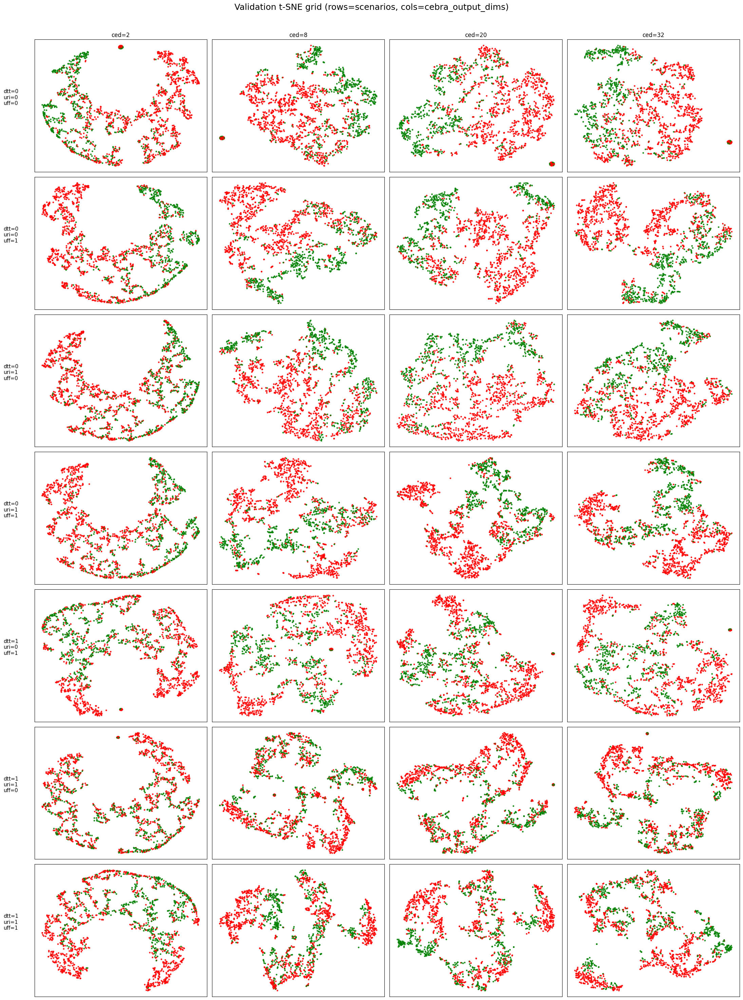

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pickle, gc
from sklearn.manifold import TSNE
import cebra

cebra_output_dims_list = [2, 8, 20, 32]

# ---- define ONLY the 7 valid rows in the order you want ----
row_scenarios = [
    {"dtt": 0, "uri": 0, "uff": 0},
    {"dtt": 0, "uri": 0, "uff": 1},
    {"dtt": 0, "uri": 1, "uff": 0},
    {"dtt": 0, "uri": 1, "uff": 1},
    {"dtt": 1, "uri": 0, "uff": 1},  # (dtt=1, uri=0, uff=0) is invalid -> skipped
    {"dtt": 1, "uri": 1, "uff": 0},
    {"dtt": 1, "uri": 1, "uff": 1},
]

# ---- create canvas ----
fig, axes = plt.subplots(len(row_scenarios), len(cebra_output_dims_list), figsize=(22, 30))

for r, sc in enumerate(row_scenarios):
    dtt, uri, uff = sc["dtt"], sc["uri"], sc["uff"]

    for c, ced in enumerate(cebra_output_dims_list):

        ax = axes[r, c]

        scenario_key = f"dtt={dtt}_uri={uri}_uff={uff}_ced={ced}"
        print("Plotting:", scenario_key)

        # ---- load splits ----
        with open("res/all_splits.pkl", "rb") as f:
            splits_store = pickle.load(f)

        if scenario_key not in splits_store:
            ax.set_title(scenario_key + "\n(MISSING)", fontsize=9)
            ax.axis("off")
            del splits_store
            gc.collect()
            continue

        X_val = splits_store[scenario_key]["X_val"]
        y_val = splits_store[scenario_key]["y_val"]

        del splits_store
        gc.collect()

        # ---- flatten for CEBRA ----
        X_val_flat = X_val.reshape(-1, X_val.shape[-1])

        # ---- load model ----
        model_path = f"models/cebra_dtt_{dtt}_uri_{uri}_uff_{uff}_ced_{ced}.pt"
        loaded_cebra_model = cebra.CEBRA.load(model_path)

        # ---- embedding ----
        val_embedding_flat = loaded_cebra_model.transform(X_val_flat)

        val_embedding = val_embedding_flat.reshape(
            X_val.shape[0],   # trials
            X_val.shape[1],   # time
            -1
        )

        val_means = val_embedding.mean(axis=1)

        # ---- t-SNE ----
        tsne = TSNE(n_components=2, perplexity=30, random_state=42, init="pca")
        Z_val = tsne.fit_transform(val_means)

        y_val_arr = np.asarray(y_val)
        colors_val = np.where(y_val_arr == 1, "red", "green")

        # ---- plot ----
        ax.scatter(Z_val[:, 0], Z_val[:, 1], c=colors_val, s=6, alpha=0.8)
        ax.set_xticks([])
        ax.set_yticks([])

        # titles: only show ced on top row
        if r == 0:
            ax.set_title(f"ced={ced}", fontsize=12)
        # label scenario on first column
        if c == 0:
            ax.set_ylabel(f"dtt={dtt}\nuri={uri}\nuff={uff}", fontsize=11, rotation=0, labelpad=50)

plt.suptitle("Validation t-SNE grid (rows=scenarios, cols=cebra_output_dims)", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/TSNE_grid_rows_scenarios_cols_ced_val.png", dpi=200)
plt.show()

### 7 rows both rain and val

Plotting: dtt=0_uri=0_uff=0_ced=2
Plotting: dtt=0_uri=0_uff=0_ced=8
Plotting: dtt=0_uri=0_uff=0_ced=20
Plotting: dtt=0_uri=0_uff=0_ced=32
Plotting: dtt=0_uri=0_uff=1_ced=2
Plotting: dtt=0_uri=0_uff=1_ced=8
Plotting: dtt=0_uri=0_uff=1_ced=20
Plotting: dtt=0_uri=0_uff=1_ced=32
Plotting: dtt=0_uri=1_uff=0_ced=2
Plotting: dtt=0_uri=1_uff=0_ced=8
Plotting: dtt=0_uri=1_uff=0_ced=20
Plotting: dtt=0_uri=1_uff=0_ced=32
Plotting: dtt=0_uri=1_uff=1_ced=2
Plotting: dtt=0_uri=1_uff=1_ced=8
Plotting: dtt=0_uri=1_uff=1_ced=20
Plotting: dtt=0_uri=1_uff=1_ced=32
Plotting: dtt=1_uri=0_uff=1_ced=2
Plotting: dtt=1_uri=0_uff=1_ced=8
Plotting: dtt=1_uri=0_uff=1_ced=20
Plotting: dtt=1_uri=0_uff=1_ced=32
Plotting: dtt=1_uri=1_uff=0_ced=2
Plotting: dtt=1_uri=1_uff=0_ced=8
Plotting: dtt=1_uri=1_uff=0_ced=20
Plotting: dtt=1_uri=1_uff=0_ced=32
Plotting: dtt=1_uri=1_uff=1_ced=2
Plotting: dtt=1_uri=1_uff=1_ced=8
Plotting: dtt=1_uri=1_uff=1_ced=20
Plotting: dtt=1_uri=1_uff=1_ced=32


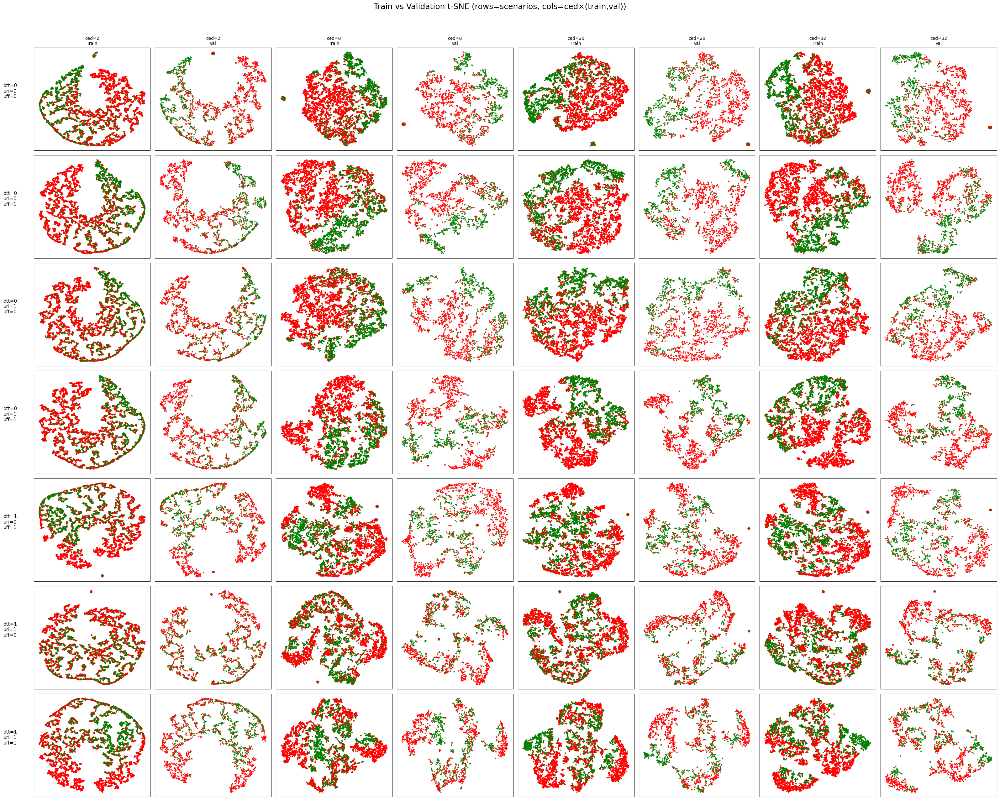

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pickle, gc
from sklearn.manifold import TSNE
import cebra

cebra_output_dims_list = [2, 8, 20, 32]

# ---- define ONLY the 7 valid rows in the order you want ----
row_scenarios = [
    {"dtt": 0, "uri": 0, "uff": 0},
    {"dtt": 0, "uri": 0, "uff": 1},
    {"dtt": 0, "uri": 1, "uff": 0},
    {"dtt": 0, "uri": 1, "uff": 1},
    {"dtt": 1, "uri": 0, "uff": 1},  # invalid (1,0,0) skipped
    {"dtt": 1, "uri": 1, "uff": 0},
    {"dtt": 1, "uri": 1, "uff": 1},
]

# ---- create 7x8 canvas ----
fig, axes = plt.subplots(len(row_scenarios), 8, figsize=(32, 26))

for r, sc in enumerate(row_scenarios):
    dtt, uri, uff = sc["dtt"], sc["uri"], sc["uff"]

    for k, ced in enumerate(cebra_output_dims_list):
        col_train = 2 * k
        col_val   = 2 * k + 1

        ax_train = axes[r, col_train]
        ax_val   = axes[r, col_val]

        scenario_key = f"dtt={dtt}_uri={uri}_uff={uff}_ced={ced}"
        print("Plotting:", scenario_key)

        # ---- load splits ----
        with open("res/all_splits.pkl", "rb") as f:
            splits_store = pickle.load(f)

        if scenario_key not in splits_store:
            ax_train.axis("off")
            ax_val.axis("off")
            del splits_store
            gc.collect()
            continue

        X_train = splits_store[scenario_key]["X_train"]
        y_train = splits_store[scenario_key]["y_train"]
        X_val   = splits_store[scenario_key]["X_val"]
        y_val   = splits_store[scenario_key]["y_val"]

        del splits_store
        gc.collect()

        # ---- flatten for CEBRA transform ----
        X_train_flat = X_train.reshape(-1, X_train.shape[-1])
        X_val_flat   = X_val.reshape(-1, X_val.shape[-1])

        # ---- load CEBRA model ----
        model_path = f"models/cebra_dtt_{dtt}_uri_{uri}_uff_{uff}_ced_{ced}.pt"
        loaded_cebra_model = cebra.CEBRA.load(model_path)

        # ---- embeddings ----
        train_embedding_flat = loaded_cebra_model.transform(X_train_flat)
        val_embedding_flat   = loaded_cebra_model.transform(X_val_flat)

        train_embedding = train_embedding_flat.reshape(X_train.shape[0], X_train.shape[1], -1)
        val_embedding   = val_embedding_flat.reshape(X_val.shape[0], X_val.shape[1], -1)

        train_means = train_embedding.mean(axis=1)
        val_means   = val_embedding.mean(axis=1)

        # ---- t-SNE ----
        tsne_train = TSNE(n_components=2, perplexity=30, random_state=42, init="pca")
        Z_train = tsne_train.fit_transform(train_means)

        tsne_val = TSNE(n_components=2, perplexity=30, random_state=42, init="pca")
        Z_val = tsne_val.fit_transform(val_means)

        colors_train = np.where(np.asarray(y_train) == 1, "red", "green")
        colors_val   = np.where(np.asarray(y_val) == 1, "red", "green")

        # ---- plot Train ----
        ax_train.scatter(Z_train[:, 0], Z_train[:, 1], c=colors_train, s=4, alpha=0.8)
        ax_train.set_xticks([])
        ax_train.set_yticks([])

        # ---- plot Val ----
        ax_val.scatter(Z_val[:, 0], Z_val[:, 1], c=colors_val, s=4, alpha=0.8)
        ax_val.set_xticks([])
        ax_val.set_yticks([])

        # ---- titles ----
        if r == 0:
            ax_train.set_title(f"ced={ced}\nTrain", fontsize=10)
            ax_val.set_title(f"ced={ced}\nVal", fontsize=10)

        # row labels on the far-left
        if col_train == 0:
            ax_train.set_ylabel(f"dtt={dtt}\nuri={uri}\nuff={uff}", fontsize=11, rotation=0, labelpad=55)

plt.suptitle("Train vs Validation t-SNE (rows=scenarios, cols=ced×(train,val))", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("plots/TSNE_train_val_grid_rows_scenarios_cols_ced.png", dpi=200)
plt.show()